Курсовая. Вариант 12. По совокупности всех англоязычных текстов с сайта https://www.gutenberg.org/ найти 100 самых частых слов, вычислить их относительные частоты в каждом тексте и кластеризовать тексты на этой основе.

Скачал архив англоязычных текстов gutenberg_en_all_2023-08.zim с сайта
https://download.kiwix.org/zim/gutenberg/, дата обновления: 2024-03-08 15:46, вес архива: 72 ГБ

Для распаковки архива в отдельные html-страницы книг использовал программу zim-tools_win-x86_64-3.5.0, скачанную с https://download.openzim.org/release/zim-tools/

Запустив терминал в папке с программой, ввёл следующую команду:

PS D:\Desktop\zim-tools_win-x86_64-3.5.0> .\zimdump.exe dump --dir=D:\Desktop\gutenberg_texts D:\Desktop\gutenberg_en_all_2023-08.zim

Все файлы архива распаковались в папке gutenberg_texts, за исключением некоторых файлов, содержащих запрещенные символы ( :, ?, *, <, >, ", |, /, и \ ), которых было несколько сотен, что, на фоне остального объема (1.463.693 файлов) — погрешность.

В конечной папке оказалось много мусорных файлов (epub, jpg, jpeg, png, bmp, svg, js, css, gif, avi, ttf, otf, xcf, pdf, wav, ini, txt, mid, midi, ly, mxl, xml, mp3, mp4, mpg, mscz, avi, psd, пустые файлы и т.д.), которые я удалил.

Также было множество файлов-"обложек" книг с расширением html, которые имели приставку "_cover.", которые тоже удалил.

В результате осталось 65287 файлов с книгами.

Код, который я использовал для перевода текстов из html в txt:

In [1]:
import os
from bs4 import BeautifulSoup

def extract_text_from_html(html_file):
    """Извлекает чистый текст из HTML-файла."""
    try:
        with open(html_file, 'r', encoding='utf-8') as file:
            soup = BeautifulSoup(file, 'html.parser')
            # Извлекаем текст из HTML
            return soup.get_text(separator='\n').strip()
    except Exception as e:
        print(f"Ошибка при обработке файла {html_file}: {e}")
        return None

def process_html_files(input_dir, output_dir):
    """Обрабатывает все HTML-файлы в папке и сохраняет текстовые версии."""
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    for root, _, files in os.walk(input_dir):
        for file in files:
            if file.endswith('.html'):
                html_path = os.path.join(root, file)
                text = extract_text_from_html(html_path)

                if text:
                    # Создаём соответствующий .txt файл
                    relative_path = os.path.relpath(html_path, input_dir)
                    txt_path = os.path.join(output_dir, os.path.splitext(relative_path)[0] + '.txt')

                    # Создаём директорию, если её нет
                    os.makedirs(os.path.dirname(txt_path), exist_ok=True)

                    # Сохраняем текст в файл
                    with open(txt_path, 'w', encoding='utf-8') as txt_file:
                        txt_file.write(text)

                    print(f"Обработан файл: {html_path} → {txt_path}")

# Укажите папки с входными HTML-файлами и выходной для текстов
input_directory = r"D:\Desktop\gutenberg_texts"
output_directory = r"D:\Desktop\gutenberg_clean_texts"

# Запускаем обработку
process_html_files(input_directory, output_directory)

Обработан файл: D:\Desktop\gutenberg_texts\$1,000 a Plate.50921.html → D:\Desktop\gutenberg_clean_texts\$1,000 a Plate.50921.txt
Обработан файл: D:\Desktop\gutenberg_texts\& Foster Bliss Bliss.44134.html → D:\Desktop\gutenberg_clean_texts\& Foster Bliss Bliss.44134.txt
Обработан файл: D:\Desktop\gutenberg_texts\& Tyler Ward Ward.46726.html → D:\Desktop\gutenberg_clean_texts\& Tyler Ward Ward.46726.txt
Обработан файл: D:\Desktop\gutenberg_texts\'A Comedy of Errors' in Seven Acts.20989.html → D:\Desktop\gutenberg_clean_texts\'A Comedy of Errors' in Seven Acts.20989.txt
Обработан файл: D:\Desktop\gutenberg_texts\'All's Well!'.27126.html → D:\Desktop\gutenberg_clean_texts\'All's Well!'.27126.txt
Обработан файл: D:\Desktop\gutenberg_texts\'And So Ad Infinitum' (The Life of the Insects).61420.html → D:\Desktop\gutenberg_clean_texts\'And So Ad Infinitum' (The Life of the Insects).61420.txt
Обработан файл: D:\Desktop\gutenberg_texts\'Doc.' Gordon.15695.html → D:\Desktop\gutenberg_clean_texts\'

Основной код программы:

In [3]:
import os
import re
from collections import Counter
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# 1. Загрузка текстов из локальной папки
def load_texts_from_folder(folder_path):
    texts = []
    for filename in os.listdir(folder_path):
        if filename.endswith(".txt"):
            with open(os.path.join(folder_path, filename), 'r', encoding='utf-8') as file:
                texts.append(file.read())
    return texts

# 2. Очистка текста
def clean_text(text):
    text = re.sub(r'[^a-zA-Z\s]', '', text)  # Удалить пунктуацию
    text = text.lower()  # Преобразовать в нижний регистр
    words = text.split()  # Разделить на слова
    return words

# 3. Частотный анализ
def get_top_words(texts, top_n=100):
    word_counts = Counter()
    for text in texts:
        word_counts.update(clean_text(text))
    return [word for word, _ in word_counts.most_common(top_n)]

# 4. Построение матрицы частотности
def build_frequency_matrix(texts, top_words):
    matrix = []
    for text in texts:
        word_counts = Counter(clean_text(text))
        frequencies = [word_counts.get(word, 0) for word in top_words]
        matrix.append(frequencies)
    return np.array(matrix)

# 5. Нормализация частот
def normalize_frequencies(frequency_matrix):
    transformer = TfidfTransformer()
    return transformer.fit_transform(frequency_matrix).toarray()

# 6. Кластеризация
def cluster_texts(matrix, method="kmeans", n_clusters=5):
    if method == "kmeans":
        model = KMeans(n_clusters=n_clusters, random_state=42)
    elif method == "dbscan":
        model = DBSCAN(eps=0.5, min_samples=5)
    elif method == "hierarchical":
        model = AgglomerativeClustering(n_clusters=n_clusters)
    else:
        raise ValueError("Unknown method")
    labels = model.fit_predict(matrix)
    return labels

# 7. Визуализация кластеров
def visualize_clusters(matrix, labels):
    scaler = StandardScaler()
    scaled_matrix = scaler.fit_transform(matrix)
    plt.figure(figsize=(10, 7))
    sns.scatterplot(x=scaled_matrix[:, 0], y=scaled_matrix[:, 1], hue=labels, palette="tab10")
    plt.title("Text Clusters")
    plt.show()

# 8. Основной процесс
def main(folder_path, top_n=100, cluster_method="kmeans", n_clusters=5):
    texts = load_texts_from_folder(folder_path)
    print(f"Loaded {len(texts)} texts.")
    
    top_words = get_top_words(texts, top_n)
    print(f"Top {top_n} words: {top_words}")
    
    frequency_matrix = build_frequency_matrix(texts, top_words)
    normalized_matrix = normalize_frequencies(frequency_matrix)
    
    labels = cluster_texts(normalized_matrix, method=cluster_method, n_clusters=n_clusters)
    print(f"Cluster labels: {labels}")
    
    visualize_clusters(normalized_matrix, labels)

Все эти тексты занимают 34 ГБ RAM

Loaded 65249 texts.
Top 100 words: ['the', 'of', 'and', 'to', 'a', 'in', 'that', 'was', 'he', 'it', 'i', 'his', 'is', 'with', 'as', 'for', 'had', 'be', 'on', 'by', 'you', 'at', 'not', 'but', 'which', 'her', 'this', 'from', 'have', 'they', 'or', 'she', 'all', 'were', 'are', 'him', 'we', 'one', 'their', 'my', 'an', 'so', 'there', 'no', 'who', 'me', 'when', 'been', 'them', 'if', 'said', 'would', 'will', 'what', 'more', 'its', 'out', 'up', 'into', 'has', 'then', 'some', 'do', 'very', 'now', 'our', 'time', 'could', 'other', 'than', 'any', 'man', 'about', 'upon', 'only', 'your', 'may', 'these', 'little', 'two', 'see', 'great', 'like', 'made', 'after', 'such', 'can', 'did', 'before', 'should', 'well', 'first', 'us', 'over', 'must', 'much', 'where', 'mr', 'most', 'good']
Cluster labels: [2 0 0 ... 4 0 4]


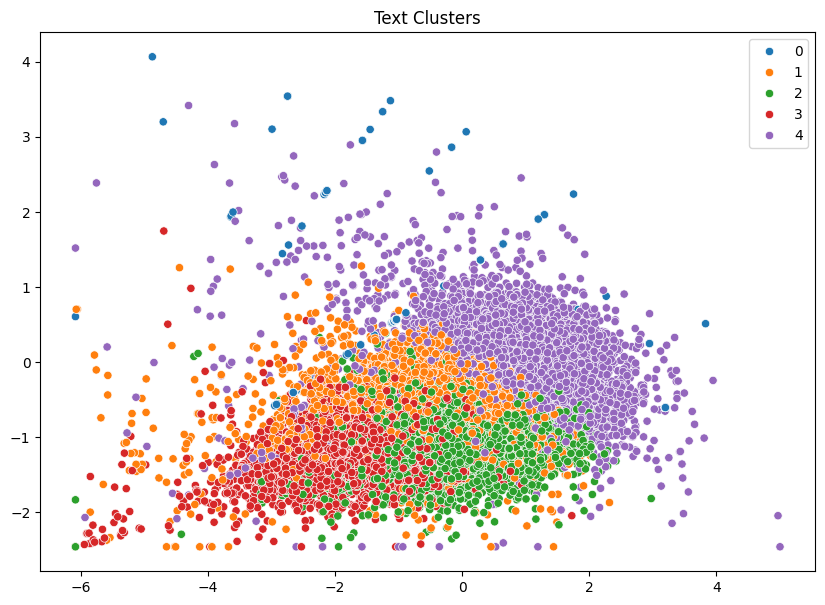

In [4]:
# Запуск анализа
# Путь к папке, содержащей скачанные тексты
folder_path = "D:\Desktop\gutenberg_clean_texts"
main(folder_path, top_n=100, cluster_method="kmeans", n_clusters=5)